<a href="https://colab.research.google.com/github/ChonnaveeSuk/TN_TTS_TON_Assignment-2-feb-25/blob/main/TTS_Thai_Lang_Experiment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#@title 1. Environment Setup & System Check

# Install required libraries
!pip install torch transformers scipy soundfile nemo_toolkit['tts']
!apt-get install -y libsndfile1

import os
import torch
import platform
import numpy as np
from transformers import VitsModel, AutoTokenizer
from nemo.collections.tts.models import UnivNetModel, Tacotron2Model
import soundfile as sf

class TTSModels:
   def __init__(self):
       self.device = 'cuda' if torch.cuda.is_available() else 'cpu'
       self.mms_model = None
       self.mms_tokenizer = None
       self.tacotron_model = None
       self.vocoder = None

   def load_models(self):
       try:
           # Load MMS-TTS
           self.mms_model = VitsModel.from_pretrained('facebook/mms-tts-tha').to(self.device)
           self.mms_tokenizer = AutoTokenizer.from_pretrained('facebook/mms-tts-tha')
           print("✓ MMS-TTS loaded")

           # Load Lunarlist
           self.tacotron_model = Tacotron2Model.from_pretrained("lunarlist/tts-thai").to(self.device)
           self.vocoder = UnivNetModel.from_pretrained("tts_en_libritts_univnet").to(self.device)
           print("✓ Lunarlist TTS loaded")
           return True

       except Exception as e:
           print(f"Error loading models: {str(e)}")
           return False

def check_system():
   print(f"Device: {'cuda' if torch.cuda.is_available() else 'cpu'}")
   if torch.cuda.is_available():
       print(f"GPU: {torch.cuda.get_device_name(0)}")
       print(f"Memory: {torch.cuda.get_device_properties(0).total_memory/1e9:.2f} GB")

   models = TTSModels()
   if models.load_models():
       print("\nSystem ready for TTS comparison!")
       return models
   return None

# Run system check
tts_models = check_system()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.5/70.5 kB 2.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.9/63.9 kB 1.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 3.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 180.3/180.3 kB 18.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Preparing metadata (setup.py) ... done
  Using cached pybind11-2.13.6-py3-none-any.whl.metadata (9.5 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 68.8 MB/s

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
libsndfile1 is already the newest version (1.0.31-2ubuntu0.1).
0 upgraded, 0 newly installed, 0 to remove and 19 not upgraded.
Device: cuda
GPU: Tesla T4
Memory: 15.83 GB


config.json:   0%|          | 0.00/1.64k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/145M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/289 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/902 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/49.0 [00:00<?, ?B/s]

✓ MMS-TTS loaded


tts-thai.nemo:   0%|          | 0.00/107M [00:00<?, ?B/s]

[NeMo W 2025-02-06 21:12:29 nemo_logging:405] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    dataset:
      _target_: nemo.collections.asr.data.audio_to_text.AudioToCharDataset
      manifest_filepath: trim_voice5/common_train.json
      max_duration: null
      min_duration: 0.1
      trim: false
      int_values: false
      normalize: false
      sample_rate: 22050
      parser: base
    dataloader_params:
      drop_last: false
      shuffle: true
      batch_size: 32
      num_workers: 5
    
[NeMo W 2025-02-06 21:12:29 nemo_logging:405] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    dataset:
      _target_: nemo.collections.asr.data.audio_to_text.

[NeMo I 2025-02-06 21:12:29 nemo_logging:393] PADDING: 16
[NeMo I 2025-02-06 21:12:29 nemo_logging:393] Model Tacotron2Model was successfully restored from /root/.cache/huggingface/hub/models--lunarlist--tts-thai/snapshots/d14156f46aa55b18b2cd9644494e744c4e80ea15/tts-thai.nemo.
[NeMo I 2025-02-06 21:12:29 nemo_logging:393] Downloading from: https://api.ngc.nvidia.com/v2/models/nvidia/nemo/tts_en_libritts_univnet/versions/1.7.0/files/tts_en_libritts_multispeaker_univnet.nemo to /root/.cache/torch/NeMo/NeMo_2.1.0/tts_en_libritts_multispeaker_univnet/74805fd10315e0a1a4bfe0f7b55ee1b5/tts_en_libritts_multispeaker_univnet.nemo
[NeMo I 2025-02-06 21:12:35 nemo_logging:393] Instantiating model from pre-trained checkpoint


[NeMo W 2025-02-06 21:12:37 nemo_logging:405] If you intend to do training or fine-tuning, please call the ModelPT.setup_training_data() method and provide a valid configuration file to setup the train data loader.
    Train config : 
    dataset:
      _target_: nemo.collections.tts.data.datalayers.AudioDataset
      manifest_filepath: /home/tkdrlf9202/Datasets/LibriTTS-22k/train-all.json
      max_duration: null
      min_duration: 0.75
      n_segments: 16384
      trim: false
    dataloader_params:
      drop_last: false
      shuffle: true
      batch_size: 8
      num_workers: 4
    
[NeMo W 2025-02-06 21:12:37 nemo_logging:405] If you intend to do validation, please call the ModelPT.setup_validation_data() or ModelPT.setup_multiple_validation_data() method and provide a valid configuration file to setup the validation data loader(s). 
    Validation config : 
    dataset:
      _target_: nemo.collections.tts.data.datalayers.AudioDataset
      manifest_filepath: /home/tkdrlf9202/

[NeMo I 2025-02-06 21:12:37 nemo_logging:393] PADDING: 0
[NeMo I 2025-02-06 21:12:37 nemo_logging:393] STFT using exact pad
[NeMo I 2025-02-06 21:12:37 nemo_logging:393] PADDING: 0
[NeMo I 2025-02-06 21:12:37 nemo_logging:393] STFT using exact pad
[NeMo I 2025-02-06 21:12:37 nemo_logging:393] Model UnivNetModel was successfully restored from /root/.cache/torch/NeMo/NeMo_2.1.0/tts_en_libritts_multispeaker_univnet/74805fd10315e0a1a4bfe0f7b55ee1b5/tts_en_libritts_multispeaker_univnet.nemo.
✓ Lunarlist TTS loaded

System ready for TTS comparison!


In [6]:
#@title 2. Helper Functions for TTS Processing

import time
from typing import Tuple, Dict
import numpy as np
import torch
from pythainlp import word_tokenize

class TTSHelper:
    def __init__(self, tts_models: TTSModels):
        self.models = tts_models
        self.device = tts_models.device

    def preprocess_text(self, text: str) -> str:
        tokens = word_tokenize(text)
        return ' '.join(tokens)

    def generate_mms_speech(self, text: str, speaking_rate: float = 1.0) -> Tuple[int, np.ndarray]:
        inputs = self.models.mms_tokenizer(text, return_tensors="pt").to(self.device)

        with torch.no_grad():
            self.models.mms_model.speaking_rate = speaking_rate
            outputs = self.models.mms_model(**inputs)

        return self.models.mms_model.config.sampling_rate, outputs.waveform[0].cpu().numpy()

    def generate_lunarlist_speech(self, text: str) -> Tuple[int, np.ndarray]:
        """
        Generate speech using Lunarlist TTS
        Note: Lunarlist expects text directly
        """
        with torch.no_grad():
            parsed = self.models.tacotron_model.parse(text)
            spec = self.models.tacotron_model.generate_spectrogram(tokens=parsed)
            audio = self.models.vocoder.convert_spectrogram_to_audio(spec=spec)

        return 22050, audio[0].cpu().numpy()

    def measure_performance(self, text: str, speaking_rate: float = 1.0) -> Dict:
        processed_text = self.preprocess_text(text)
        results = {}

        try:
            # Test MMS-TTS
            start_time = time.time()
            sr_mms, audio_mms = self.generate_mms_speech(processed_text, speaking_rate)
            mms_time = time.time() - start_time

            results['mms'] = {
                'time': mms_time,
                'audio_length': len(audio_mms),
                'sampling_rate': sr_mms,
                'chars_per_sec': len(text) / mms_time,
                'audio': audio_mms  # เพิ่มการเก็บเสียงไว้
            }
        except Exception as e:
            print(f"MMS-TTS Error: {str(e)}")

        try:
            # Test Lunarlist
            start_time = time.time()
            sr_lunar, audio_lunar = self.generate_lunarlist_speech(processed_text)
            lunar_time = time.time() - start_time

            results['lunarlist'] = {
                'time': lunar_time,
                'audio_length': len(audio_lunar),
                'sampling_rate': sr_lunar,
                'chars_per_sec': len(text) / lunar_time,
                'audio': audio_lunar  # เพิ่มการเก็บเสียงไว้
            }
        except Exception as e:
            print(f"Lunarlist Error: {str(e)}")

        return results

    def save_audio(self, audio: np.ndarray, sampling_rate: int, filename: str):
        import soundfile as sf
        sf.write(filename, audio, sampling_rate)

tts_helper = TTSHelper(tts_models)

# Test the helper functions
test_text = "สวัสดีครับ นี่เป็นการทดสอบ"
results = tts_helper.measure_performance(test_text)

print("\nPerformance Test Results:")
for model, metrics in results.items():
    print(f"\n{model.upper()} Performance:")
    print(f"Processing time: {metrics['time']:.3f} seconds")
    print(f"Characters per second: {metrics['chars_per_sec']:.2f}")
    print(f"Audio length: {metrics['audio_length']} samples")

    # บันทึกเสียงสำหรับแต่ละโมเดล
    tts_helper.save_audio(
        metrics['audio'],
        metrics['sampling_rate'],
        f"output_{model}.wav"
    )


Performance Test Results:

MMS Performance:
Processing time: 0.191 seconds
Characters per second: 136.23
Audio length: 44544 samples

LUNARLIST Performance:
Processing time: 3.666 seconds
Characters per second: 7.09
Audio length: 190464 samples


In [7]:
#@title 3. Text Processing and Test Cases

from typing import List, Dict
import pandas as pd

class TestCaseGenerator:
   def __init__(self):
       # Test cases by category
       self.test_cases = {
           'short_simple': [
               "สวัสดีครับ",
               "ขอบคุณมาก",
               "ไปกินข้าวกัน"
           ],
           'numbers': [
               "ราคา 1,234 บาท",
               "เวลา 15:30 น.",
               "อุณหภูมิ 35 องศา"
           ],
           'mixed_language': [
               "ผมทำงานเป็น AI Engineer",
               "เธอชอบดู Netflix มาก",
               "วันนี้ต้อง work from home"
           ],
           'punctuation': [
               "วันนี้จะไปไหน? ไปกินข้าวกัน!",
               "เธอรู้ไหม... ว่าฉันคิดถึง",
               "ทำไมล่ะ? ช่วยอธิบายหน่อย!"
           ],
           'long_text': [
               "ประเทศไทยมีประวัติศาสตร์อันยาวนาน มีวัฒนธรรมที่เป็นเอกลักษณ์",
               "การเรียนรู้เทคโนโลยีใหม่ๆ เป็นสิ่งสำคัญในยุคดิจิทัล",
               "อาหารไทยเป็นที่นิยมไปทั่วโลก ด้วยรสชาติที่เป็นเอกลักษณ์"
           ]
       }

   def get_all_test_cases(self) -> List[Dict]:
       """Get all test cases with metadata"""
       all_cases = []
       for category, texts in self.test_cases.items():
           for text in texts:
               all_cases.append({
                   'category': category,
                   'text': text,
                   'length': len(text),
                   'has_english': bool(sum(1 for c in text if ord('a') <= ord(c.lower()) <= ord('z'))),
                   'has_numbers': bool(sum(1 for c in text if c.isdigit()))
               })
       return all_cases

   def run_tests(self, tts_helper, speaking_rates=[0.8, 1.0, 1.2]) -> pd.DataFrame:
       """Run tests for all cases with different speaking rates"""
       results = []

       for case in self.get_all_test_cases():
           for rate in speaking_rates:
               print(f"Testing: {case['text'][:30]}... @ rate {rate}")
               performance = tts_helper.measure_performance(case['text'], rate)

               # Add results for each model
               for model, metrics in performance.items():
                   result = {
                       'model': model,
                       'speaking_rate': rate,
                       **case,  # Include all case metadata
                       **metrics  # Include performance metrics
                   }
                   results.append(result)

       return pd.DataFrame(results)

# Run test cases
test_generator = TestCaseGenerator()
test_results = test_generator.run_tests(tts_helper)

# Display summary statistics
print("\nTest Results Summary:")
summary = test_results.groupby(['model', 'category']).agg({
   'time': ['mean', 'std'],
   'chars_per_sec': 'mean',
   'audio_length': 'mean'
}).round(3)

print(summary)

test_results.to_csv('tts_test_results.csv', index=False)
print("\nDetailed results saved to 'tts_test_results.csv'")

Testing: สวัสดีครับ... @ rate 0.8
Testing: สวัสดีครับ... @ rate 1.0
Testing: สวัสดีครับ... @ rate 1.2
Testing: ขอบคุณมาก... @ rate 0.8
Testing: ขอบคุณมาก... @ rate 1.0
Testing: ขอบคุณมาก... @ rate 1.2
Testing: ไปกินข้าวกัน... @ rate 0.8
Testing: ไปกินข้าวกัน... @ rate 1.0


[NeMo W 2025-02-06 21:28:17 nemo_logging:405] Reached max decoder steps 1000.


Testing: ไปกินข้าวกัน... @ rate 1.2


[NeMo W 2025-02-06 21:28:19 nemo_logging:405] Reached max decoder steps 1000.


Testing: ราคา 1,234 บาท... @ rate 0.8
Testing: ราคา 1,234 บาท... @ rate 1.0
Testing: ราคา 1,234 บาท... @ rate 1.2
Testing: เวลา 15:30 น.... @ rate 0.8
Testing: เวลา 15:30 น.... @ rate 1.0
Testing: เวลา 15:30 น.... @ rate 1.2


[NeMo W 2025-02-06 21:28:28 nemo_logging:405] Reached max decoder steps 1000.


Testing: อุณหภูมิ 35 องศา... @ rate 0.8


[NeMo W 2025-02-06 21:28:30 nemo_logging:405] Reached max decoder steps 1000.


Testing: อุณหภูมิ 35 องศา... @ rate 1.0


[NeMo W 2025-02-06 21:28:31 nemo_logging:405] Reached max decoder steps 1000.


Testing: อุณหภูมิ 35 องศา... @ rate 1.2


[NeMo W 2025-02-06 21:28:33 nemo_logging:405] Reached max decoder steps 1000.


Testing: ผมทำงานเป็น AI Engineer... @ rate 0.8
Testing: ผมทำงานเป็น AI Engineer... @ rate 1.0
Testing: ผมทำงานเป็น AI Engineer... @ rate 1.2
Testing: เธอชอบดู Netflix มาก... @ rate 0.8
Testing: เธอชอบดู Netflix มาก... @ rate 1.0
Testing: เธอชอบดู Netflix มาก... @ rate 1.2
Testing: วันนี้ต้อง work from home... @ rate 0.8
Testing: วันนี้ต้อง work from home... @ rate 1.0
Testing: วันนี้ต้อง work from home... @ rate 1.2
Testing: วันนี้จะไปไหน? ไปกินข้าวกัน!... @ rate 0.8
Testing: วันนี้จะไปไหน? ไปกินข้าวกัน!... @ rate 1.0
Testing: วันนี้จะไปไหน? ไปกินข้าวกัน!... @ rate 1.2
Testing: เธอรู้ไหม... ว่าฉันคิดถึง... @ rate 0.8
Testing: เธอรู้ไหม... ว่าฉันคิดถึง... @ rate 1.0
Testing: เธอรู้ไหม... ว่าฉันคิดถึง... @ rate 1.2
Testing: ทำไมล่ะ? ช่วยอธิบายหน่อย!... @ rate 0.8
Testing: ทำไมล่ะ? ช่วยอธิบายหน่อย!... @ rate 1.0
Testing: ทำไมล่ะ? ช่วยอธิบายหน่อย!... @ rate 1.2
Testing: ประเทศไทยมีประวัติศาสตร์อันยาว... @ rate 0.8


[NeMo W 2025-02-06 21:28:53 nemo_logging:405] Reached max decoder steps 1000.


Testing: ประเทศไทยมีประวัติศาสตร์อันยาว... @ rate 1.0
Testing: ประเทศไทยมีประวัติศาสตร์อันยาว... @ rate 1.2


[NeMo W 2025-02-06 21:28:57 nemo_logging:405] Reached max decoder steps 1000.


Testing: การเรียนรู้เทคโนโลยีใหม่ๆ เป็น... @ rate 0.8


[NeMo W 2025-02-06 21:28:59 nemo_logging:405] Reached max decoder steps 1000.


Testing: การเรียนรู้เทคโนโลยีใหม่ๆ เป็น... @ rate 1.0


[NeMo W 2025-02-06 21:29:00 nemo_logging:405] Reached max decoder steps 1000.


Testing: การเรียนรู้เทคโนโลยีใหม่ๆ เป็น... @ rate 1.2
Testing: อาหารไทยเป็นที่นิยมไปทั่วโลก ด... @ rate 0.8


[NeMo W 2025-02-06 21:29:04 nemo_logging:405] Reached max decoder steps 1000.


Testing: อาหารไทยเป็นที่นิยมไปทั่วโลก ด... @ rate 1.0


[NeMo W 2025-02-06 21:29:05 nemo_logging:405] Reached max decoder steps 1000.


Testing: อาหารไทยเป็นที่นิยมไปทั่วโลก ด... @ rate 1.2

Test Results Summary:
                           time        chars_per_sec audio_length
                           mean    std          mean         mean
model     category                                               
lunarlist long_text       1.651  0.424        35.239   228494.222
          mixed_language  0.540  0.632       258.734    75434.667
          numbers         1.509  0.895        11.486   195754.667
          punctuation     1.240  0.779        68.990   154965.333
          short_simple    1.166  1.047        26.445   132664.889
mms       long_text       0.120  0.027       475.508    82688.000
          mixed_language  0.080  0.023       305.292    26453.333
          numbers         0.077  0.014       193.120    26282.667
          punctuation     0.097  0.063       317.860    42723.556
          short_simple    0.131  0.063       107.045    24035.556

Detailed results saved to 'tts_test_results.csv'


In [18]:
# 3.1 Audio Comparison Generator
import os
import soundfile as sf
import numpy as np
from typing import Dict
from IPython.display import Audio, display, HTML

class AudioComparator:
    def __init__(self, test_generator: TestCaseGenerator, tts_helper: TTSHelper):
        self.test_generator = test_generator
        self.tts_helper = tts_helper
        self.output_dir = "audio_comparisons"

        if not os.path.exists(self.output_dir):
            os.makedirs(self.output_dir)

    def generate_and_display_comparisons(self, speaking_rate: float = 1.0):
        """สร้างและแสดงการเปรียบเทียบเสียงแบบมีปุ่มกดเล่น"""
        test_cases = self.test_generator.test_cases

        for category, texts in test_cases.items():
            print(f"\n=== Category: {category} ===")

            for idx, text in enumerate(texts, 1):
                print(f"\nTest case {idx}: {text}")
                print("-" * 50)

                results = self.tts_helper.measure_performance(text, speaking_rate)
                print("\nMMS-TTS:")
                display(Audio(results['mms']['audio'], rate=results['mms']['sampling_rate']))

                print("\nLunarlist:")
                display(Audio(results['lunarlist']['audio'], rate=results['lunarlist']['sampling_rate']))

                comparison_audio = self.create_comparison_audio(results)

                print("\nComparison (MMS followed by Lunarlist):")
                display(Audio(comparison_audio, rate=22050))

                print("\nPerformance Metrics:")
                for model, metrics in results.items():
                    print(f"{model}:")
                    print(f"  Processing time: {metrics['time']:.3f} seconds")
                    print(f"  Characters per second: {metrics['chars_per_sec']:.2f}")

    def create_comparison_audio(self, results: Dict) -> np.ndarray:
        """สร้างเสียงเปรียบเทียบโดยเรียงต่อกัน"""
        # สร้าง silence 0.5 วินาที
        silence_duration = 0.5
        silence = np.zeros(int(22050 * silence_duration))

        # รวมเสียง
        combined_audio = []

        for model in ['mms', 'lunarlist']:
            if model in results:
                combined_audio.extend(results[model]['audio'])
                combined_audio.extend(silence)

        return np.array(combined_audio)

def run_audio_comparison():
    # สร้าง instance ของคลาส
    test_generator = TestCaseGenerator()
    tts_helper = TTSHelper(tts_models)
    comparator = AudioComparator(test_generator, tts_helper)

    # แสดง HTML header
    display(HTML("<h2>🎵 TTS Model Comparison 🎵</h2>"))
    display(HTML("<p>Compare the audio output of MMS-TTS and Lunarlist models</p>"))

    # สร้างและแสดงการเปรียบเทียบ
    comparator.generate_and_display_comparisons()

# รันการเปรียบเทียบ
run_audio_comparison()


=== Category: short_simple ===

Test case 1: สวัสดีครับ
--------------------------------------------------

MMS-TTS:



Lunarlist:



Comparison (MMS followed by Lunarlist):



Performance Metrics:
mms:
  Processing time: 0.094 seconds
  Characters per second: 106.94
lunarlist:
  Processing time: 0.321 seconds
  Characters per second: 31.19

Test case 2: ขอบคุณมาก
--------------------------------------------------

MMS-TTS:



Lunarlist:



Comparison (MMS followed by Lunarlist):



Performance Metrics:
mms:
  Processing time: 0.167 seconds
  Characters per second: 53.88
lunarlist:
  Processing time: 0.104 seconds
  Characters per second: 86.80

Test case 3: ไปกินข้าวกัน
--------------------------------------------------


[NeMo W 2025-02-07 01:08:59 nemo_logging:405] Reached max decoder steps 1000.



MMS-TTS:



Lunarlist:



Comparison (MMS followed by Lunarlist):



Performance Metrics:
mms:
  Processing time: 0.099 seconds
  Characters per second: 121.22
lunarlist:
  Processing time: 3.021 seconds
  Characters per second: 3.97

=== Category: numbers ===

Test case 1: ราคา 1,234 บาท
--------------------------------------------------

MMS-TTS:



Lunarlist:



Comparison (MMS followed by Lunarlist):



Performance Metrics:
mms:
  Processing time: 0.105 seconds
  Characters per second: 133.80
lunarlist:
  Processing time: 0.065 seconds
  Characters per second: 214.00

Test case 2: เวลา 15:30 น.
--------------------------------------------------

MMS-TTS:



Lunarlist:



Comparison (MMS followed by Lunarlist):



Performance Metrics:
mms:
  Processing time: 0.073 seconds
  Characters per second: 178.03
lunarlist:
  Processing time: 0.573 seconds
  Characters per second: 22.68

Test case 3: อุณหภูมิ 35 องศา
--------------------------------------------------


[NeMo W 2025-02-07 01:09:02 nemo_logging:405] Reached max decoder steps 1000.



MMS-TTS:



Lunarlist:



Comparison (MMS followed by Lunarlist):



Performance Metrics:
mms:
  Processing time: 0.114 seconds
  Characters per second: 140.07
lunarlist:
  Processing time: 1.559 seconds
  Characters per second: 10.27

=== Category: mixed_language ===

Test case 1: ผมทำงานเป็น AI Engineer
--------------------------------------------------

MMS-TTS:



Lunarlist:



Comparison (MMS followed by Lunarlist):



Performance Metrics:
mms:
  Processing time: 0.075 seconds
  Characters per second: 306.24
lunarlist:
  Processing time: 1.378 seconds
  Characters per second: 16.69

Test case 2: เธอชอบดู Netflix มาก
--------------------------------------------------

MMS-TTS:



Lunarlist:



Comparison (MMS followed by Lunarlist):



Performance Metrics:
mms:
  Processing time: 0.110 seconds
  Characters per second: 181.50
lunarlist:
  Processing time: 1.341 seconds
  Characters per second: 14.92

Test case 3: วันนี้ต้อง work from home
--------------------------------------------------

MMS-TTS:



Lunarlist:



Comparison (MMS followed by Lunarlist):



Performance Metrics:
mms:
  Processing time: 0.091 seconds
  Characters per second: 275.60
lunarlist:
  Processing time: 1.340 seconds
  Characters per second: 18.65

=== Category: punctuation ===

Test case 1: วันนี้จะไปไหน? ไปกินข้าวกัน!
--------------------------------------------------


[NeMo W 2025-02-07 01:09:09 nemo_logging:405] Reached max decoder steps 1000.



MMS-TTS:



Lunarlist:



Comparison (MMS followed by Lunarlist):



Performance Metrics:
mms:
  Processing time: 0.098 seconds
  Characters per second: 286.60
lunarlist:
  Processing time: 1.835 seconds
  Characters per second: 15.26

Test case 2: เธอรู้ไหม... ว่าฉันคิดถึง
--------------------------------------------------

MMS-TTS:



Lunarlist:



Comparison (MMS followed by Lunarlist):



Performance Metrics:
mms:
  Processing time: 0.104 seconds
  Characters per second: 240.51
lunarlist:
  Processing time: 1.181 seconds
  Characters per second: 21.17

Test case 3: ทำไมล่ะ? ช่วยอธิบายหน่อย!
--------------------------------------------------

MMS-TTS:



Lunarlist:



Comparison (MMS followed by Lunarlist):



Performance Metrics:
mms:
  Processing time: 0.079 seconds
  Characters per second: 315.32
lunarlist:
  Processing time: 1.069 seconds
  Characters per second: 23.39

=== Category: long_text ===

Test case 1: ประเทศไทยมีประวัติศาสตร์อันยาวนาน มีวัฒนธรรมที่เป็นเอกลักษณ์
--------------------------------------------------


[NeMo W 2025-02-07 01:09:13 nemo_logging:405] Reached max decoder steps 1000.



MMS-TTS:



Lunarlist:



Comparison (MMS followed by Lunarlist):



Performance Metrics:
mms:
  Processing time: 0.131 seconds
  Characters per second: 458.11
lunarlist:
  Processing time: 1.670 seconds
  Characters per second: 35.92

Test case 2: การเรียนรู้เทคโนโลยีใหม่ๆ เป็นสิ่งสำคัญในยุคดิจิทัล
--------------------------------------------------


[NeMo W 2025-02-07 01:09:15 nemo_logging:405] Reached max decoder steps 1000.



MMS-TTS:



Lunarlist:



Comparison (MMS followed by Lunarlist):



Performance Metrics:
mms:
  Processing time: 0.106 seconds
  Characters per second: 480.55
lunarlist:
  Processing time: 1.694 seconds
  Characters per second: 30.11

Test case 3: อาหารไทยเป็นที่นิยมไปทั่วโลก ด้วยรสชาติที่เป็นเอกลักษณ์
--------------------------------------------------

MMS-TTS:



Lunarlist:



Comparison (MMS followed by Lunarlist):



Performance Metrics:
mms:
  Processing time: 0.121 seconds
  Characters per second: 453.30
lunarlist:
  Processing time: 1.620 seconds
  Characters per second: 33.94


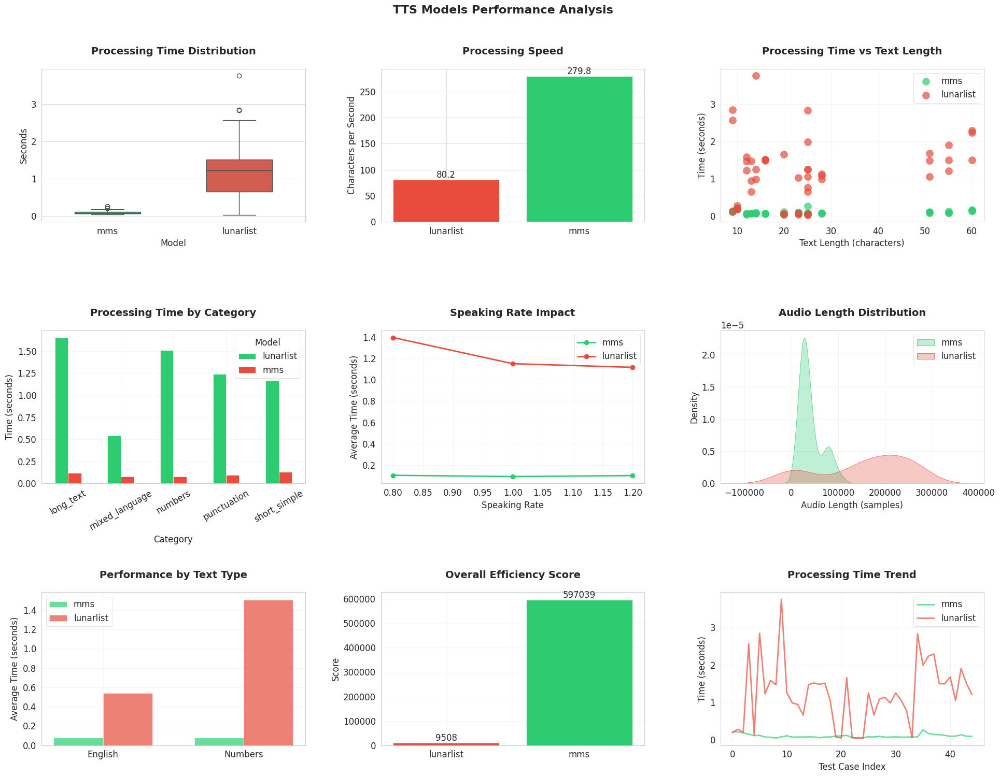

In [20]:
#@title 4. Model Evaluation and Analysis

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from typing import Dict

class TTSEvaluator:
    def __init__(self, test_results: pd.DataFrame):
        self.results = test_results
        self.colors = {
            'mms': '#2ecc71',
            'lunarlist': '#e74c3c'
        }
        # ตั้งค่า style ของ plot
        sns.set_style("whitegrid")
        plt.rcParams['figure.figsize'] = [20, 15]
        plt.rcParams['font.size'] = 12
        plt.rcParams['axes.titlesize'] = 14
        plt.rcParams['axes.labelsize'] = 12

    def plot_detailed_analysis(self):
        fig = plt.figure(dpi=100)

        # 1. Processing Time Distribution
        ax1 = plt.subplot(331)
        sns.boxplot(data=self.results, x='model', y='time',
                   palette=self.colors, width=0.5)
        ax1.set_title('Processing Time Distribution', pad=20, fontweight='bold')
        ax1.set_ylabel('Seconds')
        ax1.set_xlabel('Model')

        # 2. Processing Speed
        ax2 = plt.subplot(332)
        speed_data = self.results.groupby('model')['chars_per_sec'].mean()
        bars = ax2.bar(range(len(speed_data)), speed_data.values,
                      color=[self.colors[m] for m in speed_data.index])
        ax2.set_title('Processing Speed', pad=20, fontweight='bold')
        ax2.set_ylabel('Characters per Second')
        ax2.set_xticks(range(len(speed_data)))
        ax2.set_xticklabels(speed_data.index)

        for bar in bars:
            height = bar.get_height()
            ax2.text(bar.get_x() + bar.get_width()/2., height,
                    f'{height:.1f}', ha='center', va='bottom')

        # 3. Text Length vs Time
        ax3 = plt.subplot(333)
        for model in self.results['model'].unique():
            mask = self.results['model'] == model
            ax3.scatter(self.results[mask]['length'],
                       self.results[mask]['time'],
                       label=model, color=self.colors[model],
                       alpha=0.7, s=100)
        ax3.set_title('Processing Time vs Text Length', pad=20, fontweight='bold')
        ax3.set_xlabel('Text Length (characters)')
        ax3.set_ylabel('Time (seconds)')
        ax3.legend()
        ax3.grid(True, alpha=0.3)

        # 4. Category Performance
        ax4 = plt.subplot(334)
        category_perf = self.results.pivot_table(
            values='time',
            index='category',
            columns='model',
            aggfunc='mean'
        )
        category_perf.plot(kind='bar', ax=ax4, color=list(self.colors.values()))
        ax4.set_title('Processing Time by Category', pad=20, fontweight='bold')
        ax4.set_xlabel('Category')
        ax4.set_ylabel('Time (seconds)')
        plt.xticks(rotation=30)
        ax4.legend(title='Model')
        ax4.grid(True, alpha=0.3)

        # 5. Speaking Rate Impact
        ax5 = plt.subplot(335)
        for model in self.results['model'].unique():
            mask = self.results['model'] == model
            data = self.results[mask].groupby('speaking_rate')['time'].mean()
            ax5.plot(data.index, data.values,
                    marker='o', label=model,
                    color=self.colors[model],
                    linewidth=2)
        ax5.set_title('Speaking Rate Impact', pad=20, fontweight='bold')
        ax5.set_xlabel('Speaking Rate')
        ax5.set_ylabel('Average Time (seconds)')
        ax5.legend()
        ax5.grid(True, alpha=0.3)

        # 6. Audio Length Distribution
        ax6 = plt.subplot(336)
        for model in self.results['model'].unique():
            mask = self.results['model'] == model
            sns.kdeplot(data=self.results[mask], x='audio_length',
                       label=model, color=self.colors[model],
                       fill=True, alpha=0.3)
        ax6.set_title('Audio Length Distribution', pad=20, fontweight='bold')
        ax6.set_xlabel('Audio Length (samples)')
        ax6.set_ylabel('Density')
        ax6.legend()
        ax6.grid(True, alpha=0.3)

        # 7. Performance by Text Type
        ax7 = plt.subplot(337)
        text_types = ['has_english', 'has_numbers']
        x = np.arange(len(text_types))
        width = 0.35

        for i, model in enumerate(self.results['model'].unique()):
            means = []
            for text_type in text_types:
                mask = (self.results['model'] == model) & (self.results[text_type])
                means.append(self.results[mask]['time'].mean())
            ax7.bar(x + i*width, means, width, label=model,
                   color=self.colors[model], alpha=0.7)

        ax7.set_title('Performance by Text Type', pad=20, fontweight='bold')
        ax7.set_xticks(x + width/2)
        ax7.set_xticklabels(['English', 'Numbers'])
        ax7.set_ylabel('Average Time (seconds)')
        ax7.legend()
        ax7.grid(True, alpha=0.3)

        # 8. Efficiency Score
        ax8 = plt.subplot(338)
        efficiency = self.results.groupby('model').apply(
            lambda x: (x['chars_per_sec'].mean() / x['time'].std()) * 100
        )
        bars = ax8.bar(range(len(efficiency)), efficiency.values,
                      color=[self.colors[m] for m in efficiency.index])
        ax8.set_title('Overall Efficiency Score', pad=20, fontweight='bold')
        ax8.set_xticks(range(len(efficiency)))
        ax8.set_xticklabels(efficiency.index)
        ax8.set_ylabel('Score')

        for bar in bars:
            height = bar.get_height()
            ax8.text(bar.get_x() + bar.get_width()/2., height,
                    f'{height:.0f}', ha='center', va='bottom')
        ax8.grid(True, alpha=0.3)

        # 9. Processing Time Trend
        ax9 = plt.subplot(339)
        for model in self.results['model'].unique():
            mask = self.results['model'] == model
            ax9.plot(np.arange(len(self.results[mask])),
                    self.results[mask]['time'],
                    label=model, color=self.colors[model],
                    alpha=0.7, linewidth=2)
        ax9.set_title('Processing Time Trend', pad=20, fontweight='bold')
        ax9.set_xlabel('Test Case Index')
        ax9.set_ylabel('Time (seconds)')
        ax9.legend()
        ax9.grid(True, alpha=0.3)

        # ปรับ layout
        plt.tight_layout(pad=3.0)
        plt.suptitle('TTS Models Performance Analysis',
                    fontsize=16, fontweight='bold', y=1.02)

        return fig

evaluator = TTSEvaluator(test_results)
fig = evaluator.plot_detailed_analysis()
plt.show()